## Project on Automobile loan default dataset

Data set link: https://www.kaggle.com/saurabhbagchi/dish-network-hackathon?select=Test_Dataset.csv 

Train_Dataset: https://drive.google.com/file/d/1-8HOkvWob3e8a3yYYjVp3eHjFHBsiQyC/view?usp=sharing 

Note: Download the "Train_Dataset" and upload it in the notebook here to run the code


## Data Cleaning - Removing invalid values and imputing null values

In [ ]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import VarianceThreshold
sel = VarianceThreshold(threshold=0)

In [ ]:
auto_df = pd.read_csv("/content/Train_Dataset.csv")

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (1,7,8,16,17,18,19,20,35) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [ ]:
auto_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 121856 entries, 0 to 121855
Data columns (total 40 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   ID                          121856 non-null  int64  
 1   Client_Income               118249 non-null  object 
 2   Car_Owned                   118275 non-null  float64
 3   Bike_Owned                  118232 non-null  float64
 4   Active_Loan                 118221 non-null  float64
 5   House_Own                   118195 non-null  float64
 6   Child_Count                 118218 non-null  float64
 7   Credit_Amount               118224 non-null  object 
 8   Loan_Annuity                117044 non-null  object 
 9   Accompany_Client            120110 non-null  object 
 10  Client_Income_Type          118155 non-null  object 
 11  Client_Education            118211 non-null  object 
 12  Client_Marital_Status       118383 non-null  object 
 13  Client_Gender 

In [ ]:
auto_df.sample(5)

,ID,Client_Income,Car_Owned,Bike_Owned,Active_Loan,House_Own,Child_Count,Credit_Amount,Loan_Annuity,Accompany_Client,Client_Income_Type,Client_Education,Client_Marital_Status,Client_Gender,Loan_Contract_Type,Client_Housing_Type,Population_Region_Relative,Age_Days,Employed_Days,Registration_Days,ID_Days,Own_House_Age,Mobile_Tag,Homephone_Tag,Workphone_Working,Client_Occupation,Client_Family_Members,Cleint_City_Rating,Application_Process_Day,Application_Process_Hour,Client_Permanent_Match_Tag,Client_Contact_Work_Tag,Type_Organization,Score_Source_1,Score_Source_2,Score_Source_3,Social_Circle_Default,Phone_Change,Credit_Bureau,Default
27107,12182911,40500,1.0,0.0,0.0,0.0,0.0,90450,3832.2,Alone,Commercial,Secondary,M,Male,CL,Home,0.015221,17192,5385,125,738,2.0,1,0,1,NaN,2.0,2.0,3.0,9.0,Yes,Yes,Self-employed,0.650515,0.498739,0.411848556,0.0371,492.0,6.0,0
77429,12145239,36000,0.0,0.0,1.0,1.0,1.0,49752,5371.2,Alone,Commercial,Graduation,M,Female,CL,Home,0.008575,10749,2320,4838,3269,NaN,1,0,0,Managers,3.0,2.0,3.0,16.0,Yes,Yes,Medicine,NaN,0.214430,0.289611,0.2577,307.0,8.0,0
108410,12129283,36000,NaN,0.0,1.0,1.0,0.0,26368.7,2781.9,Alone,Commercial,Graduation,NaN,Female,CL,Home,0.035792,24579,387,1491,1617,NaN,1,0,0,Core,2.0,2.0,2.0,12.0,Yes,Yes,Medicine,0.592897,0.688403,0.334454,0.0557,465.0,4.0,0
94956,12124439,9000,0.0,0.0,0.0,1.0,2.0,61261.2,2608.65,Relative,Service,Secondary,M,Male,CL,NaN,0.020246,12671,5665,2154,4247,NaN,1,1,1,Medicine,4.0,3.0,3.0,9.0,Yes,Yes,NaN,NaN,0.525265,NaN,0.1031,2908.0,0.0,0
22074,12168659,8550,0.0,0.0,1.0,NaN,1.0,18000,900,Alone,Service,Secondary,M,Male,RL,Home,0.030755,10779,1069,4055,3052,NaN,1,0,0,Sales,3.0,2.0,5.0,13.0,Yes,Yes,Transport: type 4,0.325521,0.579856,0.76623367,NaN,699.0,1.0,0


In [ ]:
cat_text_features = ['Accompany_Client','Client_Income_Type','Client_Education','Client_Marital_Status','Client_Gender',
                     'Loan_Contract_Type','Client_Housing_Type','Client_Occupation','Type_Organization','Application_Process_Day',
                     'Application_Process_Hour','Client_Permanent_Match_Tag','Client_Contact_Work_Tag']

In [ ]:
cat_features = ['Car_Owned','Bike_Owned','Active_Loan','House_Own',
                'Mobile_Tag','Homephone_Tag','Workphone_Working','Cleint_City_Rating']

In [ ]:
num_features = ['Client_Income','Credit_Amount','Loan_Annuity','Population_Region_Relative','Age_Days','Employed_Days',
                'Registration_Days','ID_Days','Client_Family_Members','Cleint_City_Rating','Application_Process_Day'
                ,'Application_Process_Hour','Phone_Change','Child_Count','Client_Family_Members','Own_House_Age','Credit_Bureau']

In [ ]:
auto_transform_df = auto_df.drop(['ID','Score_Source_1', 'Score_Source_2','Score_Source_3','Social_Circle_Default'], axis = 1)

In [ ]:
def rm_invalid_data(feature_name,df):
  
    cnt=0
    for row in df[feature_name]:
      try:
        float(row)
        pass
      except ValueError:
        df.loc[cnt, feature_name]=np.nan
      cnt+=1

    median1 = df[feature_name].median()
    df[feature_name].replace(np.nan,median1,inplace=True)
    df[feature_name] = df[feature_name].astype(float, errors = 'raise')


In [ ]:
for t in num_features: rm_invalid_data(t,auto_transform_df)

In [ ]:
auto_transform_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 121856 entries, 0 to 121855
Data columns (total 35 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Client_Income               121856 non-null  float64
 1   Car_Owned                   118275 non-null  float64
 2   Bike_Owned                  118232 non-null  float64
 3   Active_Loan                 118221 non-null  float64
 4   House_Own                   118195 non-null  float64
 5   Child_Count                 121856 non-null  float64
 6   Credit_Amount               121856 non-null  float64
 7   Loan_Annuity                121856 non-null  float64
 8   Accompany_Client            120110 non-null  object 
 9   Client_Income_Type          118155 non-null  object 
 10  Client_Education            118211 non-null  object 
 11  Client_Marital_Status       118383 non-null  object 
 12  Client_Gender               119443 non-null  object 
 13  Loan_Contract_

In [ ]:
# def rm_cat_invalid_data(feature_name):
  
 # cnt=0
  # for row in auto_transform_df[feature_name]:
   # try:
   #  float(row)
   # pass
   #  except ValueError:
    #  auto_transform_df.loc[cnt, feature_name]=np.nan
  # cnt+=1

 # mode1 = auto_transform_df[feature_name].mode()
 #  auto_transform_df[feature_name].replace(np.nan,mode1,inplace=True)

In [ ]:
for t in cat_features: rm_invalid_data(t,auto_transform_df)

In [ ]:
auto_transform_df['Accompany_Client'].value_counts()

Alone       97409
Relative    15748
Partner      4516
Kids         1334
Others        987
Group         104
##             12
Name: Accompany_Client, dtype: int64

In [ ]:
auto_transform_df['Accompany_Client'] = auto_transform_df['Accompany_Client'].replace(to_replace = '##', value = np.nan)

In [ ]:
auto_transform_df['Client_Income_Type'].value_counts()

Service            61028
Commercial         27764
Retired            21043
Govt Job            8303
Student                8
Unemployed             6
Maternity leave        2
Businessman            1
Name: Client_Income_Type, dtype: int64

In [ ]:
auto_transform_df['Client_Education'].value_counts()

Secondary             83911
Graduation            28819
Graduation dropout     3960
Junior secondary       1455
Post Grad                66
Name: Client_Education, dtype: int64

In [ ]:
auto_transform_df['Client_Marital_Status'].value_counts()

M    87349
S    17404
D     7556
W     6074
Name: Client_Marital_Status, dtype: int64

In [ ]:
auto_transform_df['Client_Gender'].value_counts()

Male      78463
Female    40977
XNA           3
Name: Client_Gender, dtype: int64

In [ ]:
auto_transform_df['Accompany_Client'] = auto_transform_df['Accompany_Client'].replace(to_replace = 'XNA', value = np.nan)

In [ ]:
auto_transform_df['Loan_Contract_Type'].value_counts()

CL    107118
RL     11087
Name: Loan_Contract_Type, dtype: int64

In [ ]:
auto_transform_df['Client_Housing_Type'].value_counts()

Home         104870
Family         5783
Municipal      4248
Rental         1816
Office         1002
Shared          450
Name: Client_Housing_Type, dtype: int64

In [ ]:
auto_transform_df['Client_Occupation'].value_counts()

Laborers              21024
Sales                 12136
Core                  10611
Managers               8099
Drivers                7150
High skill tech        4317
Accountants            3766
Medicine               3172
Security               2683
Cooking                2224
Cleaning               1722
Private service        1006
Low-skill Laborers      787
Secretaries             531
Waiters/barmen          511
Realty agents           280
HR                      206
IT                      196
Name: Client_Occupation, dtype: int64

In [ ]:
auto_transform_df['Type_Organization'].value_counts()

Business Entity Type 3    26279
XNA                       21085
Self-employed             14725
Other                      6290
Medicine                   4320
Business Entity Type 2     4126
Government                 3971
School                     3371
Trade: type 7              2979
Kindergarten               2686
Construction               2623
Business Entity Type 1     2313
Transport: type 4          2076
Trade: type 3              1338
Security                   1284
Industry: type 9           1280
Industry: type 3           1235
Housing                    1162
Military                   1031
Bank                       1012
Agriculture                1011
Industry: type 11           999
Police                      934
Postal                      834
Transport: type 2           811
Security Ministries         756
Trade: type 2               717
Restaurant                  710
Services                    570
University                  559
Transport: type 3           501
Industry

In [ ]:
auto_transform_df['Accompany_Client'] = auto_transform_df['Accompany_Client'].replace(to_replace = 'XNA', value = np.nan)

In [ ]:
def rm_cat_null_data(feature_name,df):
  
  df[feature_name] = df[feature_name].replace(np.nan,'Other')

In [ ]:
for t in cat_text_features: rm_cat_null_data(t,auto_transform_df)

In [ ]:
auto_transform_df.isnull().sum()

Client_Income                 0
Car_Owned                     0
Bike_Owned                    0
Active_Loan                   0
House_Own                     0
Child_Count                   0
Credit_Amount                 0
Loan_Annuity                  0
Accompany_Client              0
Client_Income_Type            0
Client_Education              0
Client_Marital_Status         0
Client_Gender                 0
Loan_Contract_Type            0
Client_Housing_Type           0
Population_Region_Relative    0
Age_Days                      0
Employed_Days                 0
Registration_Days             0
ID_Days                       0
Own_House_Age                 0
Mobile_Tag                    0
Homephone_Tag                 0
Workphone_Working             0
Client_Occupation             0
Client_Family_Members         0
Cleint_City_Rating            0
Application_Process_Day       0
Application_Process_Hour      0
Client_Permanent_Match_Tag    0
Client_Contact_Work_Tag       0
Type_Org

## Getting the Profile of the data 

### Restart run-time

In [ ]:
#!pip install pandas==0.25 
!pip install -U pandas-profiling==2.8.0
#!jupyter nbextension enable --py widgetsnbextension

     |████████████████████████████████| 259 kB 5.0 MB/s 
     |████████████████████████████████| 4.7 MB 38.9 MB/s 
     |████████████████████████████████| 675 kB 70.9 MB/s 
     |████████████████████████████████| 59 kB 4.2 MB/s 
     |████████████████████████████████| 812 kB 59.2 MB/s 
     |████████████████████████████████| 38.1 MB 1.2 MB/s 
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=d313911af789c1b8fe7f5ad292796f207fcf818a3ef5f0f3badf19eff0a5146f
  Stored in directory: /root/.cache/pip/wheels/70/e1/52/5b14d250ba868768823940c3229e9950d201a26d0bd3ee8655
  Created wheel for imagehash: filename=ImageHash-4.2.1-py2.py3-none-any.whl size=295207 sha256=9562650d89424ef5d35169039650ea6762cf627d9e0bb766ac59da8766f41a8f
  Stored in directory: /root/.cache/pip/wheels/4c/d5/59/5e3e297533ddb09407769762985d134135064c6831e29a914e
Successfully built htmlmin imagehash
  Attempting uninstall: scipy
    Found existing installation: scipy 1.4.1
    Uninstallin

### Generate Profile

In [ ]:
import pandas_profiling
from pandas_profiling import ProfileReport

In [ ]:
pd.__version__

'1.1.5'

In [ ]:
np.__version__

'1.19.5'

In [ ]:
profile = ProfileReport(auto_transform_df, title = 'Automobile Loan default Profiling Report')

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/49 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile.to_file("autoloan_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
auto_transform_df = auto_transform_df.drop_duplicates()
auto_transform_df.shape

(118321, 35)

##Encoding - OHE for Low cardinality Cat Features

In [ ]:
from sklearn.preprocessing import OneHotEncoder

In [ ]:
ohe_encoder = OneHotEncoder()

In [ ]:
ohe_encoder.fit(auto_transform_df[cat_features])

OneHotEncoder()

In [ ]:
ohe_encoder.categories_

[array([0., 1.]),
 array([0., 1.]),
 array([0., 1.]),
 array([0., 1.]),
 array([0., 1.]),
 array([0., 1.]),
 array([0., 1.]),
 array([1., 2., 3.])]

In [ ]:
encoded_cat_names = list(ohe_encoder.get_feature_names(cat_features))

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [ ]:
encoded_cols = ohe_encoder.transform(auto_transform_df[cat_features])

In [ ]:
type(encoded_cols)

scipy.sparse.csr.csr_matrix

In [ ]:
encoded_cols_df = pd.DataFrame.sparse.from_spmatrix(encoded_cols.tocsc(), 
                                                columns=encoded_cat_names)

In [ ]:
encoded_cols_df.shape

(121856, 17)

In [ ]:
encoded_cols_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 121856 entries, 0 to 121855
Data columns (total 17 columns):
 #   Column                  Non-Null Count   Dtype             
---  ------                  --------------   -----             
 0   Car_Owned_0.0           121856 non-null  Sparse[float64, 0]
 1   Car_Owned_1.0           121856 non-null  Sparse[float64, 0]
 2   Bike_Owned_0.0          121856 non-null  Sparse[float64, 0]
 3   Bike_Owned_1.0          121856 non-null  Sparse[float64, 0]
 4   Active_Loan_0.0         121856 non-null  Sparse[float64, 0]
 5   Active_Loan_1.0         121856 non-null  Sparse[float64, 0]
 6   House_Own_0.0           121856 non-null  Sparse[float64, 0]
 7   House_Own_1.0           121856 non-null  Sparse[float64, 0]
 8   Mobile_Tag_0.0          121856 non-null  Sparse[float64, 0]
 9   Mobile_Tag_1.0          121856 non-null  Sparse[float64, 0]
 10  Homephone_Tag_0.0       121856 non-null  Sparse[float64, 0]
 11  Homephone_Tag_1.0       121856 non-null

In [ ]:
encoded_cols_df.sample(10)

,Car_Owned_0.0,Car_Owned_1.0,Bike_Owned_0.0,Bike_Owned_1.0,Active_Loan_0.0,Active_Loan_1.0,House_Own_0.0,House_Own_1.0,Mobile_Tag_0.0,Mobile_Tag_1.0,Homephone_Tag_0.0,Homephone_Tag_1.0,Workphone_Working_0.0,Workphone_Working_1.0,Cleint_City_Rating_1.0,Cleint_City_Rating_2.0,Cleint_City_Rating_3.0
9293,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
117993,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
82884,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
85573,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0
110155,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
39408,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
90606,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
105297,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
28898,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
41511,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0


In [ ]:
auto_transform_df = auto_transform_df.join(encoded_cols_df)

In [ ]:
auto_transform_df = auto_transform_df.drop(cat_features,axis=1)

In [ ]:
auto_transform_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 121856 entries, 0 to 121855
Data columns (total 44 columns):
 #   Column                      Non-Null Count   Dtype             
---  ------                      --------------   -----             
 0   Client_Income               121856 non-null  float64           
 1   Child_Count                 121856 non-null  float64           
 2   Credit_Amount               121856 non-null  float64           
 3   Loan_Annuity                121856 non-null  float64           
 4   Accompany_Client            121856 non-null  object            
 5   Client_Income_Type          121856 non-null  object            
 6   Client_Education            121856 non-null  object            
 7   Client_Marital_Status       121856 non-null  object            
 8   Client_Gender               121856 non-null  object            
 9   Loan_Contract_Type          121856 non-null  object            
 10  Client_Housing_Type         121856 non-null  object     

## Encoding - TE for High cardinality Cat Features

In [ ]:
!pip install --upgrade category_encoders


     |████████████████████████████████| 82 kB 362 kB/s 


In [ ]:
import category_encoders as ce 

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
for t in cat_text_features:
    encoder=ce.TargetEncoder(cols= t)
    auto_transform_df[t] = encoder.fit_transform(auto_transform_df[t], auto_transform_df['Default'])

In [ ]:
auto_transform_df.head(5)

,Client_Income,Child_Count,Credit_Amount,Loan_Annuity,Accompany_Client,Client_Income_Type,Client_Education,Client_Marital_Status,Client_Gender,Loan_Contract_Type,Client_Housing_Type,Population_Region_Relative,Age_Days,Employed_Days,Registration_Days,ID_Days,Own_House_Age,Client_Occupation,Client_Family_Members,Application_Process_Day,Application_Process_Hour,Client_Permanent_Match_Tag,Client_Contact_Work_Tag,Type_Organization,Phone_Change,Credit_Bureau,Default,Car_Owned_0.0,Car_Owned_1.0,Bike_Owned_0.0,Bike_Owned_1.0,Active_Loan_0.0,Active_Loan_1.0,House_Own_0.0,House_Own_1.0,Mobile_Tag_0.0,Mobile_Tag_1.0,Homephone_Tag_0.0,Homephone_Tag_1.0,Workphone_Working_0.0,Workphone_Working_1.0,Cleint_City_Rating_1.0,Cleint_City_Rating_2.0,Cleint_City_Rating_3.0
0,6750.0,0.0,61190.55,3416.85,0.08222,0.075890,0.090918,0.079074,0.070670,0.083123,0.077858,0.028663,13957.0,1062.0,6123.0,383.0,9.0,0.097643,2.0,0.082819,0.064179,0.077445,0.077228,0.101596,63.0,1.0,0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
1,20250.0,0.0,15282.00,1826.55,0.08222,0.094809,0.050835,0.079074,0.070670,0.083123,0.077858,0.008575,14162.0,4129.0,7833.0,21.0,0.0,0.067503,2.0,0.082816,0.081645,0.077445,0.077228,0.065727,755.0,1.0,0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
2,18000.0,1.0,59527.35,2788.20,0.08222,0.094809,0.082828,0.064537,0.070670,0.083123,0.112398,0.022800,16790.0,5102.0,4493.0,331.0,9.0,0.075000,2.0,0.080435,0.081851,0.077445,0.077228,0.101596,277.0,0.0,0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
3,15750.0,0.0,53870.40,2295.45,0.08222,0.055410,0.090918,0.079074,0.070670,0.083123,0.077858,0.010556,23195.0,365243.0,4493.0,775.0,9.0,0.067503,2.0,0.082891,0.080196,0.077445,0.077228,0.055537,1700.0,3.0,0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
4,33750.0,2.0,133988.40,3547.35,0.08222,0.075890,0.090918,0.079074,0.100154,0.083123,0.077858,0.020713,11366.0,2977.0,5516.0,4043.0,6.0,0.104595,4.0,0.082816,0.081851,0.077445,0.077228,0.091784,674.0,1.0,0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0


In [ ]:
auto_transform_df.shape

(121856, 44)

## SMOTE sampling

In [ ]:
!pip install imblearn

In [ ]:
!pip install delayed

     |████████████████████████████████| 85 kB 2.5 MB/s 
     |████████████████████████████████| 119 kB 11.4 MB/s 


In [ ]:
from imblearn.over_sampling import SMOTE

In [ ]:
x_features = list(auto_transform_df.columns)
x_features.remove('Default')

In [ ]:
auto_transform_df['Default'].value_counts()

0    112011
1      9845
Name: Default, dtype: int64

In [ ]:
auto_transform_df.shape

(121856, 44)

In [ ]:
auto_transform_df.sample(5)

,Client_Income,Child_Count,Credit_Amount,Loan_Annuity,Accompany_Client,Client_Income_Type,Client_Education,Client_Marital_Status,Client_Gender,Loan_Contract_Type,Client_Housing_Type,Population_Region_Relative,Age_Days,Employed_Days,Registration_Days,ID_Days,Own_House_Age,Client_Occupation,Client_Family_Members,Application_Process_Day,Application_Process_Hour,Client_Permanent_Match_Tag,Client_Contact_Work_Tag,Type_Organization,Phone_Change,Credit_Bureau,Default,Car_Owned_0.0,Car_Owned_1.0,Bike_Owned_0.0,Bike_Owned_1.0,Active_Loan_0.0,Active_Loan_1.0,House_Own_0.0,House_Own_1.0,Mobile_Tag_0.0,Mobile_Tag_1.0,Homephone_Tag_0.0,Homephone_Tag_1.0,Workphone_Working_0.0,Workphone_Working_1.0,Cleint_City_Rating_1.0,Cleint_City_Rating_2.0,Cleint_City_Rating_3.0
13771,13500.0,0.0,104256.00,3458.70,0.082220,0.055410,0.090918,0.096989,0.100154,0.083123,0.077858,0.022625,18507.0,365243.0,10301.0,1946.0,10.0,0.067503,1.0,0.082891,0.081851,0.077445,0.077228,0.055537,0.0,1.0,0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
107970,20250.0,0.0,63000.00,4977.45,0.082220,0.075890,0.082828,0.079074,0.100154,0.083123,0.077858,0.006671,10963.0,445.0,1079.0,2366.0,1.0,0.067503,2.0,0.082816,0.081851,0.077445,0.077228,0.091784,350.0,0.0,0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
94009,20250.0,0.0,36319.05,2439.90,0.082220,0.075890,0.090918,0.078894,0.100154,0.083123,0.077858,0.018209,20317.0,747.0,527.0,3074.0,13.0,0.104595,2.0,0.080435,0.083610,0.077445,0.077228,0.147705,662.0,1.0,0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
81305,13500.0,0.0,27000.00,1350.00,0.082220,0.094809,0.090918,0.096989,0.070670,0.057455,0.084350,0.018029,15534.0,4106.0,9219.0,4638.0,9.0,0.070577,1.0,0.081324,0.102804,0.077445,0.077228,0.078594,755.0,0.0,0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
66909,18000.0,0.0,104046.30,3055.05,0.074359,0.075890,0.090918,0.079074,0.070670,0.083123,0.084350,0.025164,18029.0,980.0,8702.0,1562.0,9.0,0.056057,2.0,0.080435,0.080196,0.077445,0.077228,0.044177,1526.0,3.0,0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0


In [ ]:
X_resampled, y_resampled = SMOTE().fit_resample(auto_transform_df[x_features], 
                                                auto_transform_df['Default'])

/usr/local/lib/python3.7/dist-packages/sklearn/utils/validation.py:617: UserWarning: pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.
  "pandas.DataFrame with sparse columns found."


In [ ]:
X_resampled.shape

(224022, 43)

In [ ]:
X_resampled.head(2)

,Client_Income,Child_Count,Credit_Amount,Loan_Annuity,Accompany_Client,Client_Income_Type,Client_Education,Client_Marital_Status,Client_Gender,Loan_Contract_Type,Client_Housing_Type,Population_Region_Relative,Age_Days,Employed_Days,Registration_Days,ID_Days,Own_House_Age,Client_Occupation,Client_Family_Members,Application_Process_Day,Application_Process_Hour,Client_Permanent_Match_Tag,Client_Contact_Work_Tag,Type_Organization,Phone_Change,Credit_Bureau,Car_Owned_0.0,Car_Owned_1.0,Bike_Owned_0.0,Bike_Owned_1.0,Active_Loan_0.0,Active_Loan_1.0,House_Own_0.0,House_Own_1.0,Mobile_Tag_0.0,Mobile_Tag_1.0,Homephone_Tag_0.0,Homephone_Tag_1.0,Workphone_Working_0.0,Workphone_Working_1.0,Cleint_City_Rating_1.0,Cleint_City_Rating_2.0,Cleint_City_Rating_3.0
0,6750.0,0.0,61190.55,3416.85,0.08222,0.075890,0.090918,0.079074,0.07067,0.083123,0.077858,0.028663,13957.0,1062.0,6123.0,383.0,9.0,0.097643,2.0,0.082819,0.064179,0.077445,0.077228,0.101596,63.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
1,20250.0,0.0,15282.00,1826.55,0.08222,0.094809,0.050835,0.079074,0.07067,0.083123,0.077858,0.008575,14162.0,4129.0,7833.0,21.0,0.0,0.067503,2.0,0.082816,0.081645,0.077445,0.077228,0.065727,755.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0


In [ ]:
y_resampled.value_counts()

1    112011
0    112011
Name: Default, dtype: int64

In [ ]:
auto_transform_df = X_resampled.join(y_resampled)

In [ ]:
auto_transform_df.head(5)

,Client_Income,Child_Count,Credit_Amount,Loan_Annuity,Accompany_Client,Client_Income_Type,Client_Education,Client_Marital_Status,Client_Gender,Loan_Contract_Type,Client_Housing_Type,Population_Region_Relative,Age_Days,Employed_Days,Registration_Days,ID_Days,Own_House_Age,Client_Occupation,Client_Family_Members,Application_Process_Day,Application_Process_Hour,Client_Permanent_Match_Tag,Client_Contact_Work_Tag,Type_Organization,Phone_Change,Credit_Bureau,Car_Owned_0.0,Car_Owned_1.0,Bike_Owned_0.0,Bike_Owned_1.0,Active_Loan_0.0,Active_Loan_1.0,House_Own_0.0,House_Own_1.0,Mobile_Tag_0.0,Mobile_Tag_1.0,Homephone_Tag_0.0,Homephone_Tag_1.0,Workphone_Working_0.0,Workphone_Working_1.0,Cleint_City_Rating_1.0,Cleint_City_Rating_2.0,Cleint_City_Rating_3.0,Default
0,6750.0,0.0,61190.55,3416.85,0.08222,0.075890,0.090918,0.079074,0.070670,0.083123,0.077858,0.028663,13957.0,1062.0,6123.0,383.0,9.0,0.097643,2.0,0.082819,0.064179,0.077445,0.077228,0.101596,63.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0
1,20250.0,0.0,15282.00,1826.55,0.08222,0.094809,0.050835,0.079074,0.070670,0.083123,0.077858,0.008575,14162.0,4129.0,7833.0,21.0,0.0,0.067503,2.0,0.082816,0.081645,0.077445,0.077228,0.065727,755.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0
2,18000.0,1.0,59527.35,2788.20,0.08222,0.094809,0.082828,0.064537,0.070670,0.083123,0.112398,0.022800,16790.0,5102.0,4493.0,331.0,9.0,0.075000,2.0,0.080435,0.081851,0.077445,0.077228,0.101596,277.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0
3,15750.0,0.0,53870.40,2295.45,0.08222,0.055410,0.090918,0.079074,0.070670,0.083123,0.077858,0.010556,23195.0,365243.0,4493.0,775.0,9.0,0.067503,2.0,0.082891,0.080196,0.077445,0.077228,0.055537,1700.0,3.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0
4,33750.0,2.0,133988.40,3547.35,0.08222,0.075890,0.090918,0.079074,0.100154,0.083123,0.077858,0.020713,11366.0,2977.0,5516.0,4043.0,6.0,0.104595,4.0,0.082816,0.081851,0.077445,0.077228,0.091784,674.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0


In [ ]:
auto_transform_df.shape

(224022, 44)

## AutoML 

### Split Data into Test and Train

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
train_df, test_df = train_test_split(auto_transform_df,
                                     train_size = 0.8,
                                     random_state = 100)

In [ ]:
train_df.shape

(179217, 44)

In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 179217 entries, 7930 to 38408
Data columns (total 44 columns):
 #   Column                      Non-Null Count   Dtype             
---  ------                      --------------   -----             
 0   Client_Income               179217 non-null  float64           
 1   Child_Count                 179217 non-null  float64           
 2   Credit_Amount               179217 non-null  float64           
 3   Loan_Annuity                179217 non-null  float64           
 4   Accompany_Client            179217 non-null  float64           
 5   Client_Income_Type          179217 non-null  float64           
 6   Client_Education            179217 non-null  float64           
 7   Client_Marital_Status       179217 non-null  float64           
 8   Client_Gender               179217 non-null  float64           
 9   Loan_Contract_Type          179217 non-null  float64           
 10  Client_Housing_Type         179217 non-null  float64  

### Finding the best model

In [ ]:
# Installing H2O dependencies
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future

In [ ]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html
     |████████████████████████████████| 175.8 MB 28 kB/s 
  Created wheel for h2o: filename=h2o-3.34.0.3-py2.py3-none-any.whl size=175832480 sha256=4a82f41052209cf83e6f1488b6aa37bb4c99d86229a49d6274eb6dc025d7f697
  Stored in directory: /root/.cache/pip/wheels/2a/52/cf/01f6938288f0731963463ff72510db67f9f3076f801038b2f7
Successfully built h2o


In [ ]:
import h2o
from h2o.automl import H2OAutoML

In [ ]:
## prepare data
h2o.init()

h2o_train = h2o.H2OFrame(train_df)
h2o_test = h2o.H2OFrame(test_df)

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.11" 2021-04-20; OpenJDK Runtime Environment (build 11.0.11+9-Ubuntu-0ubuntu2.18.04); OpenJDK 64-Bit Server VM (build 11.0.11+9-Ubuntu-0ubuntu2.18.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.7/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpwc_ammov
  JVM stdout: /tmp/tmpwc_ammov/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpwc_ammov/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.34.0.3
H2O_cluster_version_age:,1 month and 18 days
H2O_cluster_name:,H2O_from_python_unknownUser_sv8kx7
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
x_features = list(train_df.drop(['Default'],axis=1))
x_features

['Client_Income',
 'Child_Count',
 'Credit_Amount',
 'Loan_Annuity',
 'Accompany_Client',
 'Client_Income_Type',
 'Client_Education',
 'Client_Marital_Status',
 'Client_Gender',
 'Loan_Contract_Type',
 'Client_Housing_Type',
 'Population_Region_Relative',
 'Age_Days',
 'Employed_Days',
 'Registration_Days',
 'ID_Days',
 'Own_House_Age',
 'Client_Occupation',
 'Client_Family_Members',
 'Application_Process_Day',
 'Application_Process_Hour',
 'Client_Permanent_Match_Tag',
 'Client_Contact_Work_Tag',
 'Type_Organization',
 'Phone_Change',
 'Credit_Bureau',
 'Car_Owned_0.0',
 'Car_Owned_1.0',
 'Bike_Owned_0.0',
 'Bike_Owned_1.0',
 'Active_Loan_0.0',
 'Active_Loan_1.0',
 'House_Own_0.0',
 'House_Own_1.0',
 'Mobile_Tag_0.0',
 'Mobile_Tag_1.0',
 'Homephone_Tag_0.0',
 'Homephone_Tag_1.0',
 'Workphone_Working_0.0',
 'Workphone_Working_1.0',
 'Cleint_City_Rating_1.0',
 'Cleint_City_Rating_2.0',
 'Cleint_City_Rating_3.0']

In [ ]:
aml = H2OAutoML(max_models=10,
                seed=1,
                stopping_metric='MSE',
                sort_metric='MSE',
                max_runtime_secs = 300,
                exclude_algos = ["GLM", "DeepLearning"])

aml.train(x=x_features, 
          y='Default', 
          training_frame=h2o_train) 

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%
Model Details
H2OStackedEnsembleEstimator :  Stacked Ensemble
Model Key:  StackedEnsemble_BestOfFamily_2_AutoML_1_20211126_102815

No model summary for this model

ModelMetricsRegressionGLM: stackedensemble
** Reported on train data. **

MSE: 0.029539645089483615
RMSE: 0.17187101294134394
MAE: 0.0887456197353349
RMSLE: 0.11705904054700031
R^2: 0.8818395100258037
Mean Residual Deviance: 0.029539645089483615
Null degrees of freedom: 9949
Residual degrees of freedom: 9946
Null deviance: 2487.491271018332
Residual deviance: 293.91946864036197
AIC: -6797.242253651692

ModelMetricsRegressionGLM: stackedensemble
** Reported on cross-validation data. **

MSE: 0.044733431766876774
RMSE: 0.2115027937566707
MAE: 0.11194803076836458
RMSLE: 0.14897461113658003
R^2: 0.8210662345538089
Mean Residual Deviance: 0.044733431766876774
Null degrees of freedom: 179216
Residual degrees of freedom: 179213
Null devia

### Leaderboard 

In [ ]:
lb = h2o.automl.get_leaderboard(aml, extra_columns = 'ALL')
lb

model_id,mse,mean_residual_deviance,rmse,mae,rmsle,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_BestOfFamily_2_AutoML_1_20211126_102815,0.0447334,0.0447334,0.211503,0.111948,0.148975,1952,0.008916,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_1_20211126_102815,0.0447373,0.0447373,0.211512,0.111952,0.148981,2304,0.010187,StackedEnsemble
StackedEnsemble_BestOfFamily_1_AutoML_1_20211126_102815,0.045581,0.045581,0.213497,0.114128,0.150584,3464,0.00811,StackedEnsemble
XGBoost_1_AutoML_1_20211126_102815,0.0460688,0.0460688,0.214636,0.117878,0.152925,19535,0.002498,XGBoost
GBM_1_AutoML_1_20211126_102815,0.0722989,0.0722989,0.268884,0.217095,0.193172,19188,0.005032,GBM
DRF_1_AutoML_1_20211126_102815,0.0801581,0.0801581,0.283122,0.113764,0.197687,1500,0.000968,DRF
XGBoost_2_AutoML_1_20211126_102815,0.151127,0.151127,0.38875,0.379454,0.278083,2145,0.000819,XGBoost
GBM_2_AutoML_1_20211126_102815,0.192711,0.192711,0.438989,0.435793,0.311453,936,0.000983,GBM
GBM_3_AutoML_1_20211126_102815,0.202331,0.202331,0.449812,0.447654,0.318551,623,0.000898,GBM
GBM_4_AutoML_1_20211126_102815,0.213558,0.213558,0.462124,0.461111,0.326669,683,0.000854,GBM


In [ ]:
xgb_model = h2o.get_model('XGBoost_1_AutoML_1_20211126_102815')
xgb_model

Model Details
H2OXGBoostEstimator :  XGBoost
Model Key:  XGBoost_1_AutoML_1_20211126_102815


Model Summary: 


,,number_of_trees
0,,12.0




ModelMetricsRegression: xgboost
** Reported on train data. **

MSE: 0.030247407494894032
RMSE: 0.17391781822140603
MAE: 0.09169049991395276
RMSLE: 0.12108371378564987
Mean Residual Deviance: 0.030247407494894032

ModelMetricsRegression: xgboost
** Reported on cross-validation data. **

MSE: 0.04606882581276836
RMSE: 0.21463649692624123
MAE: 0.1178777448929147
RMSLE: 0.15292455137056876
Mean Residual Deviance: 0.04606882581276836

Cross-Validation Metrics Summary: 


,,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
0,mae,0.117878,0.002693,0.119587,0.119781,0.119178,0.117508,0.113335
1,mean_residual_deviance,0.046069,0.001729,0.046237,0.046790,0.047929,0.046138,0.043250
2,mse,0.046069,0.001729,0.046237,0.046790,0.047929,0.046138,0.043250
3,r2,0.815722,0.006916,0.815051,0.812834,0.808285,0.815446,0.826997
4,residual_deviance,0.046069,0.001729,0.046237,0.046790,0.047929,0.046138,0.043250
5,rmse,0.214606,0.004058,0.215028,0.216311,0.218926,0.214798,0.207966
6,rmsle,0.152912,0.002217,0.153102,0.153629,0.155475,0.152981,0.149370



Scoring History: 


,,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance
0,,2021-11-26 10:30:00,1 min 44.115 sec,0.0,0.500000,0.500000,0.250000
1,,2021-11-26 10:30:08,1 min 52.023 sec,5.0,0.216879,0.162677,0.047036
2,,2021-11-26 10:30:15,1 min 59.749 sec,10.0,0.180129,0.098344,0.032446
3,,2021-11-26 10:30:19,2 min 3.170 sec,12.0,0.173918,0.091690,0.030247



Variable Importances: 


,variable,relative_importance,scaled_importance,percentage
0,Client_Gender,10823.078125,1.000000,0.222704
1,Client_Occupation,5042.675781,0.465919,0.103762
2,Car_Owned_0.0,4004.653564,0.370011,0.082403
3,Client_Education,3876.050537,0.358128,0.079757
4,Cleint_City_Rating_3.0,3161.641846,0.292120,0.065057
5,Active_Loan_0.0,3151.638916,0.291196,0.064851
6,Workphone_Working_0.0,2739.839111,0.253148,0.056377
7,House_Own_0.0,1548.057617,0.143033,0.031854
8,Type_Organization,1139.942017,0.105325,0.023456
9,Child_Count,827.408325,0.076449,0.017025



See the whole table with table.as_data_frame()


In [ ]:
varimp = xgb_model.varimp()

In [ ]:
varimp_df = pd.DataFrame(varimp, columns = ['variable',	
                                            'relative_importance',	
                                            'scaled_importance',	
                                            'percentage'])
varimp_df

,variable,relative_importance,scaled_importance,percentage
0,Client_Gender,10823.078125,1.000000,0.222704
1,Client_Occupation,5042.675781,0.465919,0.103762
2,Car_Owned_0.0,4004.653564,0.370011,0.082403
3,Client_Education,3876.050537,0.358128,0.079757
4,Cleint_City_Rating_3.0,3161.641846,0.292120,0.065057
5,Active_Loan_0.0,3151.638916,0.291196,0.064851
6,Workphone_Working_0.0,2739.839111,0.253148,0.056377
7,House_Own_0.0,1548.057617,0.143033,0.031854
8,Type_Organization,1139.942017,0.105325,0.023456
9,Child_Count,827.408325,0.076449,0.017025


In [ ]:
varimp_df['cumsum'] = varimp_df.percentage.cumsum()
varimp_df[0:20]

,variable,relative_importance,scaled_importance,percentage,cumsum
0,Client_Gender,10823.078125,1.000000,0.222704,0.222704
1,Client_Occupation,5042.675781,0.465919,0.103762,0.326467
2,Car_Owned_0.0,4004.653564,0.370011,0.082403,0.408870
3,Client_Education,3876.050537,0.358128,0.079757,0.488626
4,Cleint_City_Rating_3.0,3161.641846,0.292120,0.065057,0.553683
5,Active_Loan_0.0,3151.638916,0.291196,0.064851,0.618534
6,Workphone_Working_0.0,2739.839111,0.253148,0.056377,0.674911
7,House_Own_0.0,1548.057617,0.143033,0.031854,0.706765
8,Type_Organization,1139.942017,0.105325,0.023456,0.730221
9,Child_Count,827.408325,0.076449,0.017025,0.747247


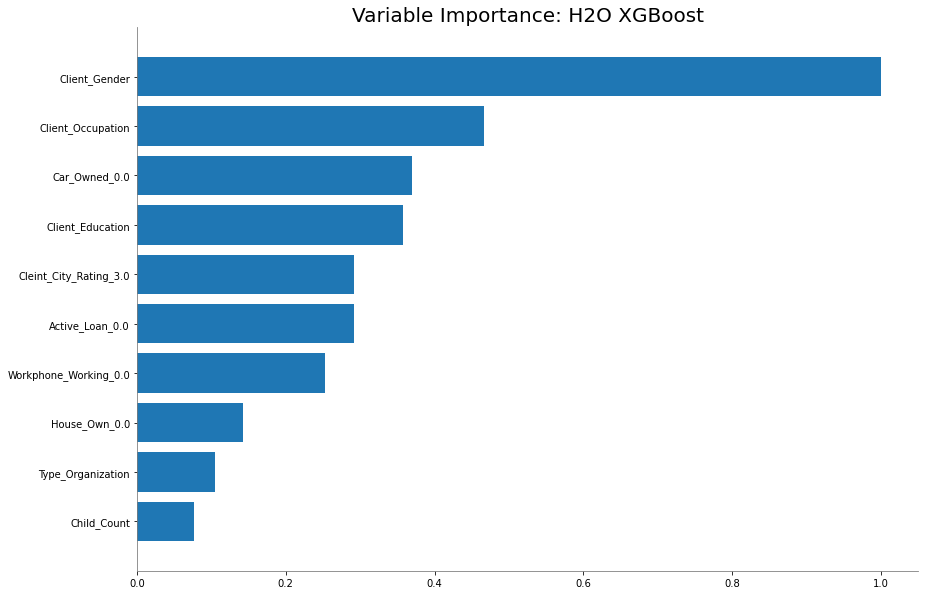

In [ ]:
xgb_model.varimp_plot()

## Data Cleaning for Experiment Tracking

In [ ]:
selected_columns = auto_df[["Client_Gender","Client_Occupation","Car_Owned","Client_Education","Active_Loan","Cleint_City_Rating",
                            "Workphone_Working","House_Own","Type_Organization","Client_Income_Type","Registration_Days",
                            "Child_Count","Credit_Amount","Default"]]

In [ ]:
auto_abridged_df = selected_columns.copy()

In [ ]:
auto_abridged_df.shape

(121856, 14)

In [ ]:
auto_abridged_df.head(10)

,Client_Gender,Client_Occupation,Car_Owned,Client_Education,Active_Loan,Cleint_City_Rating,Workphone_Working,House_Own,Type_Organization,Client_Income_Type,Registration_Days,Child_Count,Credit_Amount,Default
0,Male,Sales,0.0,Secondary,1.0,2.0,0,0.0,Self-employed,Commercial,6123,0.0,61190.55,0
1,Male,NaN,1.0,Graduation,1.0,2.0,1,NaN,Government,Service,7833,0.0,15282,0
2,Male,Realty agents,0.0,Graduation dropout,1.0,2.0,0,0.0,Self-employed,Service,NaN,1.0,59527.35,0
3,Male,NaN,0.0,Secondary,1.0,3.0,0,1.0,XNA,Retired,NaN,0.0,53870.4,0
4,Female,Laborers,1.0,Secondary,1.0,1.0,0,0.0,Business Entity Type 3,Commercial,5516,2.0,133988.4,0
5,Female,Laborers,0.0,Secondary,1.0,2.0,0,1.0,Other,Service,3910,1.0,13752,0
6,Male,NaN,1.0,Secondary,0.0,2.0,0,1.0,XNA,Retired,113,0.0,128835,0
7,Male,NaN,0.0,Secondary,1.0,2.0,1,1.0,XNA,Retired,12617,0.0,60415.2,0
8,Female,Sales,1.0,Graduation,0.0,2.0,1,1.0,Self-employed,Commercial,5455,1.0,45000,0
9,Male,NaN,0.0,Secondary,0.0,2.0,0,1.0,XNA,Retired,2834,0.0,16320.15,0


In [ ]:
auto_abridged_df['Default'].value_counts()

0    112011
1      9845
Name: Default, dtype: int64

In [ ]:
num_abridge_features = ['Registration_Days','Credit_Amount','Child_Count']
cat_abridge_features = ['Car_Owned','Active_Loan',
                        'Workphone_Working','House_Own','Cleint_City_Rating']
cat_text_abridge_features = ['Client_Gender','Client_Occupation','Client_Education','Type_Organization','Client_Income_Type']

In [ ]:
for t in num_abridge_features: rm_invalid_data(t,auto_abridged_df)

In [ ]:
for t in cat_abridge_features: rm_invalid_data(t,auto_abridged_df)

In [ ]:
for t in cat_text_abridge_features: rm_cat_null_data(t,auto_abridged_df)

In [ ]:
auto_abridged_df.isnull().sum()

Client_Gender         0
Client_Occupation     0
Car_Owned             0
Client_Education      0
Active_Loan           0
Cleint_City_Rating    0
Workphone_Working     0
House_Own             0
Type_Organization     0
Client_Income_Type    0
Registration_Days     0
Child_Count           0
Credit_Amount         0
Default               0
dtype: int64

## Experiment Tracking

### Setup

In [ ]:
!pip install category_encoders

In [ ]:
!pip install wandb

     |████████████████████████████████| 1.7 MB 5.1 MB/s 
     |████████████████████████████████| 140 kB 51.3 MB/s 
     |████████████████████████████████| 97 kB 6.2 MB/s 
     |████████████████████████████████| 180 kB 48.7 MB/s 
     |████████████████████████████████| 63 kB 1.7 MB/s 
  Created wheel for subprocess32: filename=subprocess32-3.5.4-py3-none-any.whl size=6502 sha256=3a65373b99c4b57c33b273717bdfd4cacf9f13b3993199f7163638aa676b24e6
  Stored in directory: /root/.cache/pip/wheels/50/ca/fa/8fca8d246e64f19488d07567547ddec8eb084e8c0d7a59226a
  Created wheel for pathtools: filename=pathtools-0.1.2-py3-none-any.whl size=8807 sha256=c39760d4ad20075e713a756fbd8a441ef5c62093e6b5a15b26d7c77f5cead9d3
  Stored in directory: /root/.cache/pip/wheels/3e/31/09/fa59cef12cdcfecc627b3d24273699f390e71828921b2cbba2
Successfully built subprocess32 pathtools


In [ ]:
from category_encoders import OneHotEncoder, TargetEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import r2_score, mean_squared_error
import xgboost as xgb
import wandb
import os
from sklearn import metrics
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score

In [ ]:
auto_abridged_df.head(5)

,Client_Gender,Client_Occupation,Car_Owned,Client_Education,Active_Loan,Cleint_City_Rating,Workphone_Working,House_Own,Type_Organization,Client_Income_Type,Registration_Days,Child_Count,Credit_Amount,Default
0,Male,Sales,0.0,Secondary,1.0,2.0,0.0,0.0,Self-employed,Commercial,6123.0,0.0,61190.55,0
1,Male,Other,1.0,Graduation,1.0,2.0,1.0,1.0,Government,Service,7833.0,0.0,15282.00,0
2,Male,Realty agents,0.0,Graduation dropout,1.0,2.0,0.0,0.0,Self-employed,Service,4493.0,1.0,59527.35,0
3,Male,Other,0.0,Secondary,1.0,3.0,0.0,1.0,XNA,Retired,4493.0,0.0,53870.40,0
4,Female,Laborers,1.0,Secondary,1.0,1.0,0.0,0.0,Business Entity Type 3,Commercial,5516.0,2.0,133988.40,0


In [ ]:
x_columns = ['Client_Gender','Client_Occupation','Car_Owned','Client_Education','Active_Loan','Cleint_City_Rating','Workphone_Working',
             'House_Own','Type_Organization','Client_Income_Type','Registration_Days','Child_Count','Credit_Amount']

In [ ]:
cat_features = list(set(cat_abridge_features)) + list(set(cat_text_abridge_features))
cat_features

['Car_Owned',
 'Cleint_City_Rating',
 'House_Own',
 'Active_Loan',
 'Workphone_Working',
 'Client_Occupation',
 'Client_Income_Type',
 'Client_Gender',
 'Client_Education',
 'Type_Organization']

In [ ]:
num_features = list(set(x_columns) - set(cat_features))
num_features

['Child_Count', 'Credit_Amount', 'Registration_Days']

In [ ]:
def prepare_data(X,
                 y,
#                 num_scaler = None,
#                 num_imputer = None,
#                 cat_imputer = None,
                 cat_encoder,
                 num_features,
                 cat_features,
                 train_size = 0.8,
                 seed = 100):
  
  # Split the dataset into train and test split
  x_train, x_test, y_train, y_test = train_test_split(X,
                                                      y,
                                                      train_size = train_size,
                                                      random_state = seed)
  
  
  # encoder the categorical features
  cat_encoder.fit(X=x_train, y=y_train)
  x_train_encoded = cat_encoder.transform(x_train)
  x_test_encoded = cat_encoder.transform(x_test)

  return x_train_encoded, x_test_encoded, y_train, y_test

In [ ]:
os.environ["WANDB_API_KEY"] = "f35716e05b0528d3fabc5bd931dc2bf7e80e8aae"

In [ ]:
#x_train.head(5)

In [ ]:
#y_train.head(5)

In [ ]:
def run_model_experiment(model,
                         x_train,
                         y_train,
                         x_test,
                         y_test,
                         name,
                         config = None,
                         tags = None):
  
  model.fit(x_train, y_train)

  wandb.init(project='auto_loan', config=config, tags = tags)
  wandb.run.name = name
  r2 = model.score(x_test, y_test)

  aucs = roc_auc_score(y_test, model.predict(x_test))
  precision = precision_score(y_test, model.predict(x_test), average='macro')
  recall = recall_score(y_test, model.predict(x_test), average='macro')
  f1 = f1_score(y_test, model.predict(x_test), average='macro')
  accuracy = accuracy_score(y_test, model.predict(x_test))

  wandb.log( {"auc": aucs, 
              "r2": r2,
              "precision": precision,
              "recall": recall,
              "f1": f1,
              "accuracy": accuracy} )
  
  #wandb.sklearn.plot_regressor(model, 
  #                             x_train, 
   #                            x_test, 
    #                           y_train, 
     #                          y_test,  
      #                         model_name=name)
  
  wandb.Artifact(name, 
                 type = 'model',
                 description = config)

  wandb.save()
  wandb.finish()

  return model

### Baseline: Logistic Regression

In [ ]:
ohe_encoder = OneHotEncoder(cols = cat_features,
                            use_cat_names = True)

x_train, x_test, y_train, y_test = prepare_data(auto_abridged_df[x_columns],
                                                auto_abridged_df.Default,
                                                cat_encoder = ohe_encoder,
                                                num_features = num_features,
                                                cat_features = cat_features)

lg_model = LogisticRegression(solver = 'lbfgs') 

lg_model = run_model_experiment(lg_model,
                                   x_train,
                                   y_train,
                                   x_test,
                                   y_test,
                                   name = 'LogRegressionWithOHE',
                                   tags = ['Logistic Regression', 'baseline', 'OheEncoder'])

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
wandb: WARNING Calling run.save without any arguments is deprecated.Changes to attributes are automatically persisted.


accuracy,▁
auc,▁
f1,▁
precision,▁
r2,▁
recall,▁
accuracy,0.91753
auc,0.5
f1,0.4785
precision,0.45876
r2,0.91753


### Decision Tree

In [ ]:
ohe_encoder = OneHotEncoder(cols = cat_features,
                            use_cat_names = True)

x_train, x_test, y_train, y_test = prepare_data(auto_abridged_df[x_columns],
                                                auto_abridged_df.Default,
                                                cat_encoder = ohe_encoder,
                                                num_features = num_features,
                                                cat_features = cat_features)

dtree_model = DecisionTreeClassifier(max_depth = 10) 

dtree_model = run_model_experiment(dtree_model,
                                   x_train,
                                   y_train,
                                   x_test,
                                   y_test,
                                   name = 'DecisionTreeWithOHE',
                                   tags = ['Decision Tree', 'OheEncoder'])

wandb: WARNING Calling run.save without any arguments is deprecated.Changes to attributes are automatically persisted.


accuracy,▁
auc,▁
f1,▁
precision,▁
r2,▁
recall,▁
accuracy,0.91556
auc,0.50119
f1,0.48276
precision,0.53238
r2,0.91556


### Random Forest

In [ ]:
ohe_encoder = OneHotEncoder(cols = cat_features,
                            use_cat_names = True)

x_train, x_test, y_train, y_test = prepare_data(auto_abridged_df[x_columns],
                                                auto_abridged_df.Default,
                                                cat_encoder = ohe_encoder,
                                                num_features = num_features,
                                                cat_features = cat_features)

In [ ]:
params = { "n_estimators": 100,
           "max_depth": 10,
           "max_features": .2,
           "max_samples": 0.4 }

In [ ]:
rf_model = RandomForestClassifier(**params)

In [ ]:
rf_model = run_model_experiment(rf_model,
                                x_train,
                                y_train,
                                x_test,
                                y_test,
                                config = params,
                                name = 'RFwithOHE',
                                tags = ['RF', 'OheEncoding'])

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
wandb: WARNING Calling run.save without any arguments is deprecated.Changes to attributes are automatically persisted.


accuracy,▁
auc,▁
f1,▁
precision,▁
r2,▁
recall,▁
accuracy,0.91753
auc,0.5
f1,0.4785
precision,0.45876
r2,0.91753


### RandomForest with Target Encoding

In [ ]:
target_encoder = TargetEncoder(cols = cat_features)

x_train, x_test, y_train, y_test = prepare_data(auto_abridged_df[x_columns],
                                                auto_abridged_df.Default,
                                                cat_encoder = ohe_encoder,
                                                num_features = num_features,
                                                cat_features = cat_features)

params = { "n_estimators": 100,
           "max_depth": 10,
           "max_features": .2,
           "max_samples": 0.4 }

rf_model = RandomForestClassifier(**params)  

rf_model = run_model_experiment(rf_model,
                                x_train,
                                y_train,
                                x_test,
                                y_test,
                                config = params,
                                name = 'RFwithTargetEncoding',
                                tags = ['RF', 'TargetEncoding'])

### Gradient Boosted Trees

In [ ]:
target_encoder = TargetEncoder(cols = cat_features)

x_train, x_test, y_train, y_test = prepare_data(auto_abridged_df[x_columns],
                                                auto_abridged_df.Default,
                                                cat_encoder = ohe_encoder,
                                                num_features = num_features,
                                                cat_features = cat_features)

params = { "n_estimators": 100,
           "max_depth": 4 }

gbm_model = GradientBoostingClassifier(**params)  

gbm_model = run_model_experiment(gbm_model,
                                 x_train,
                                 y_train,
                                 x_test,
                                 y_test,
                                 config = params,
                                 name = 'GBMwithTargetEncoding',
                                 tags = ['GBM', 'TargetEncoding'])

wandb: WARNING Calling run.save without any arguments is deprecated.Changes to attributes are automatically persisted.


accuracy,▁
auc,▁
f1,▁
precision,▁
r2,▁
recall,▁
accuracy,0.91736
auc,0.50014
f1,0.47895
precision,0.54211
r2,0.91736


### Grid Search and Best Model Tracking

In [ ]:
target_encoder = TargetEncoder(cols = cat_features)

x_train, x_test, y_train, y_test = prepare_data(auto_abridged_df[x_columns],
                                                auto_abridged_df.Default,
                                                cat_encoder = ohe_encoder,
                                                num_features = num_features,
                                                cat_features = cat_features)

params = { "n_estimators": [100, 200, 300],
           "max_depth": [4, 6] }

gbm_cv = GridSearchCV(GradientBoostingClassifier(),
                      param_grid = params,
                      cv = 5,
                      scoring = 'accuracy')  

gbm_cv.fit(x_train, y_train)         

GridSearchCV(cv=5, estimator=GradientBoostingClassifier(),
             param_grid={'max_depth': [4, 6], 'n_estimators': [100, 200, 300]},
             scoring='accuracy')

In [ ]:
gbm_cv.best_params_

{'max_depth': 4, 'n_estimators': 100}

In [ ]:
gbm_model = GradientBoostingClassifier(**gbm_cv.best_params_)  

gbm_model = run_model_experiment(gbm_model,
                                 x_train,
                                 y_train,
                                 x_test,
                                 y_test,
                                 config = gbm_cv.best_params_,
                                 name = 'GBMwithTargetEncoding',
                                 tags = ['GBM', 'TargetEncoding'])

wandb: WARNING Calling run.save without any arguments is deprecated.Changes to attributes are automatically persisted.


accuracy,▁
auc,▁
f1,▁
precision,▁
r2,▁
recall,▁
accuracy,0.91745
auc,0.50018
f1,0.47897
precision,0.58378
r2,0.91745


### XGB Model

In [ ]:
target_encoder = TargetEncoder(cols = cat_features)


x_train, x_test, y_train, y_test = prepare_data(auto_abridged_df[x_columns],
                                                auto_abridged_df.Default,
                                                cat_encoder = ohe_encoder,
                                                num_features = num_features,
                                                cat_features = cat_features)

params = { "n_estimators": 200,
           "max_depth": 6,
           "objective": 'reg:logistic' }

xgb_classifier = xgb.XGBClassifier(**params)

wandb.init(project='auto_loan', 
           config=params, 
           tags = ['XGB', 'TargetEncoding'])

xgb_classifier.fit(x_train, 
                  y_train, 
                  callbacks=[wandb.xgboost.wandb_callback()])

wandb.run.name = "XGBWithTargetEncoding"

# rmse = np.sqrt(mean_squared_error(y_test, 
  #                                xgb_classifier.predict(x_test)))
aucs = roc_auc_score(y_test, xgb_classifier.predict(x_test))
precision = precision_score(y_test, xgb_classifier.predict(x_test), average='macro')
recall = recall_score(y_test, xgb_classifier.predict(x_test), average='macro')
f1 = f1_score(y_test, xgb_classifier.predict(x_test), average='macro')
accuracy = accuracy_score(y_test, xgb_classifier.predict(x_test))

r2 = xgb_classifier.score(x_test, y_test)

wandb.log( {"auc": aucs, 
              "r2": r2,
              "precision": precision,
              "recall": recall,
              "f1": f1,
              "accuracy": accuracy} )
  
wandb.save()
wandb.finish()

wandb: WARNING Calling run.save without any arguments is deprecated.Changes to attributes are automatically persisted.


accuracy,▁
auc,▁
f1,▁
precision,▁
r2,▁
recall,▁
accuracy,0.91757
auc,0.50025
f1,0.479
precision,0.95878
r2,0.91757


## Get Experiment Details

In [ ]:
api = wandb.Api()

all_runs = api.runs("sree1988/auto_loan", order="+summary_metrics.rmse")

for run in all_runs:
  print(f"Model Name: {run.name} and RMSE {run.summary.get('rmse')}")
  print(run.config)

Model Name: GBMwithTargetEncoding and RMSE 0.2716393699081205
{'max_depth': 6, 'n_estimators': 100}
Model Name: XGBWithTargetEncoding and RMSE 0.27172948775087397
{'max_depth': 6, 'objective': 'reg:squarederror', 'n_estimators': 200}
Model Name: GBMwithTargetEncoding and RMSE 0.2719188899678714
{'max_depth': 6, 'n_estimators': 100}
Model Name: GBMwithTargetEncoding and RMSE 0.2720207966885149
{'max_depth': 4, 'n_estimators': 100}
Model Name: RFwithOHE and RMSE 0.272044837337913
{'max_depth': 10, 'max_samples': 0.4, 'max_features': 0.2, 'n_estimators': 100}
Model Name: RFwithTargetEncoding and RMSE 0.27211595288074863
{'max_depth': 10, 'max_samples': 0.4, 'max_features': 0.2, 'n_estimators': 100}
Model Name: RFwithTargetEncoding and RMSE 0.27224003372005184
{'max_depth': 10, 'max_samples': 0.4, 'max_features': 0.2, 'n_estimators': 100}
Model Name: RFwithTargetEncoding and RMSE 0.27225045215063226
{'max_depth': 10, 'max_samples': 0.4, 'max_features': 0.2, 'n_estimators': 100}
Model Name:

## Generating ONNX file

In [ ]:
!pip install wandb
!pip install onnx
!pip install skl2onnx
!pip install onnxruntime
!pip install onnxmltools

     |████████████████████████████████| 12.7 MB 4.1 MB/s 
     |████████████████████████████████| 271 kB 4.1 MB/s 
     |████████████████████████████████| 77 kB 5.0 MB/s 
     |████████████████████████████████| 4.8 MB 4.0 MB/s 
     |████████████████████████████████| 300 kB 3.9 MB/s 


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from xgboost import XGBClassifier
from onnx.tools.net_drawer import GetPydotGraph, GetOpNodeProducer
import onnxruntime as rt
from skl2onnx import convert_sklearn, __version__, update_registered_converter
from skl2onnx.common.data_types import FloatTensorType, StringTensorType
from skl2onnx.common.data_types import Int64TensorType
from skl2onnx.common.shape_calculator import calculate_linear_classifier_output_shapes
from onnxmltools.convert.xgboost.operator_converters.XGBoost import convert_xgboost  # noqa
import pprint
import os
import wandb

### Pipeline for deployment

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(auto_abridged_df[x_columns],
                                                    auto_abridged_df.Default,
                                                    train_size = 0.8,
                                                    random_state = 100)

In [ ]:
numeric_transformer = Pipeline(steps=[('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[('onehot', 
                                           OneHotEncoder(handle_unknown='ignore'))])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, num_features),                  
        ('cat', categorical_transformer, cat_features),
    ])

params = { "n_estimators": 400,
           "max_depth": 4,
           "objective": 'reg:logistic' }

xgb_classifier = XGBClassifier(**params)

reg = Pipeline(steps=[('preprocessor', preprocessor),
                      ('regressor', xgb_classifier)])           

reg.fit(x_train, 
        y_train)

#rmse = np.sqrt(mean_squared_error(y_test, 
 #                                 reg.predict(x_test)))
aucs = roc_auc_score(y_test, reg.predict(x_test))

### Creating ONNX Graph

In [ ]:
def convert_dataframe_schema(df, drop=None):
    inputs = []
    for k, v in zip(df.columns, df.dtypes):
        if drop is not None and k in drop:
            continue
        if v == 'int64':
            t = FloatTensorType([None, 1])
        elif v == 'float64':
            t = FloatTensorType([None, 1])
        else:
            t = StringTensorType([None, 1])
        inputs.append((k, t))
    return inputs


inputs = convert_dataframe_schema(x_train)

pprint.pprint(inputs)

[('Client_Gender', StringTensorType(shape=[None, 1])),
 ('Client_Occupation', StringTensorType(shape=[None, 1])),
 ('Car_Owned', FloatTensorType(shape=[None, 1])),
 ('Client_Education', StringTensorType(shape=[None, 1])),
 ('Active_Loan', FloatTensorType(shape=[None, 1])),
 ('Cleint_City_Rating', FloatTensorType(shape=[None, 1])),
 ('Workphone_Working', FloatTensorType(shape=[None, 1])),
 ('House_Own', FloatTensorType(shape=[None, 1])),
 ('Type_Organization', StringTensorType(shape=[None, 1])),
 ('Client_Income_Type', StringTensorType(shape=[None, 1])),
 ('Registration_Days', FloatTensorType(shape=[None, 1])),
 ('Child_Count', FloatTensorType(shape=[None, 1])),
 ('Credit_Amount', FloatTensorType(shape=[None, 1]))]


In [ ]:
update_registered_converter(
    XGBClassifier, 'XGBoostXGBClassifier',
    calculate_linear_classifier_output_shapes, convert_xgboost,
    options={'nocl': [True, False], 'zipmap': [True, False, 'columns']})

### Converting the pipeline to ONNX format

In [ ]:
model_onnx = convert_sklearn(
    reg, 'pipeline_xgboost',
    inputs)

### Storing the pipeline in a file

In [ ]:
MODEL_DIR = "./autoloan"
MODEL_FILE_NAME = "autoloan_xgboost.onnx"

In [ ]:
os.mkdir(MODEL_DIR)
# And save.
with open(MODEL_DIR + "/" + MODEL_FILE_NAME, "wb") as f:
    f.write(model_onnx.SerializeToString())

### Uploading the pipeline to weights and biases for tracking

In [ ]:
os.environ["WANDB_API_KEY"] = "f35716e05b0528d3fabc5bd931dc2bf7e80e8aae"

In [ ]:
wandb.init(project='autoloanprod', 
           config=params, 
           tags = ['XGB', 'TargetEncoding'])

wandb.run.name = "XGBProdModel"

In [ ]:
wandb.log( {"auc" : aucs} )

In [ ]:
model_artifact = wandb.Artifact("XGBoost_AutoLoan",
                                type = 'model',
                                description = 'XGBoost Model for used car price prediction')

In [ ]:
model_artifact.add_dir(MODEL_DIR)

wandb: Adding directory to artifact (./autoloan)... Done. 0.1s


In [ ]:
wandb.run.log_artifact(model_artifact)

In [ ]:
wandb.save()
wandb.finish()

wandb: WARNING Calling run.save without any arguments is deprecated.Changes to attributes are automatically persisted.


auc,▁
auc,0.49998


In [ ]:
import skl2onnx 

skl2onnx.get_latest_tested_opset_version()

15